# Лабораторная работа по модулю “Математика и статистика в Python”


### 1. Загрузить файл auto.csv

In [35]:
# загружаем необходимые библиотеки

import numpy as np
from scipy.stats import t
from scipy.stats import norm
import matplotlib.pyplot as plt
from scipy import stats
import pandas as pd
import io
import requests
import seaborn as sns
%matplotlib inline

In [36]:
data=pd.read_csv('auto.csv')
data.head()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,164,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,164,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,164,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450


In [37]:
data.shape

(205, 26)

### 2. Рассчитать основные статистики для переменных(среднее, медиана, мода, мин/макс, сред. отклонение)

In [38]:
# Вычисляем количество значений, среднее, стандартное отклонение, 
# минимум, квантиль 50% - медиана, максимум

data.describe()

,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834146,126.365854,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.324878,3.253366,10.142537,106.048780,5131.463415,25.219512,30.751220,13312.712195
std,1.245307,35.438400,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.273049,0.313937,3.972040,43.468803,480.933330,6.542142,6.886443,8102.472461
min,-2.000000,65.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,0.000000,101.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.130000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7775.000000
50%,1.000000,122.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,2.000000,150.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,120.000000,5500.000000,30.000000,34.000000,16503.000000
max,3.000000,256.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


In [39]:
# мода для всех столбцов

data.mode()

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,0.0,161.0,toyota,gas,std,four,sedan,fwd,front,94.5,...,92,mpfi,3.62,3.4,9.0,68.0,5500.0,31.0,25.0,6785.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# проверяем что вычислили моду правильно (считаем для одного столбца)

data['normalized-losses'].mode()

0    161
Name: normalized-losses, dtype: int64

In [10]:
# проверяем что вычислили моду правильно (считаем для одного столбца)

data['wheel-base'].mode()

0    94.5
Name: wheel-base, dtype: float64

### 3. Рассчитать и визуализировать корреляционную матрицу для переменных

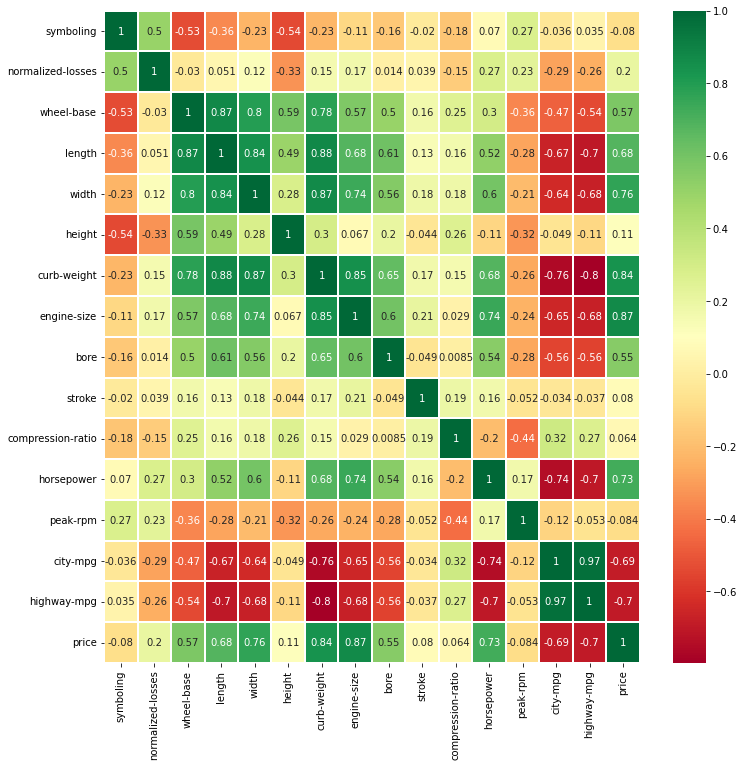

In [40]:
sns.heatmap(data.corr(),annot=True,cmap='RdYlGn',linewidths=0.2) #data.corr()-->correlation matrix
fig=plt.gcf()
fig.set_size_inches(12,12)
plt.show()

### Pandas profiling perk

модуль для создания полного отчета о ДФ

тормозит на больших ДФ

In [3]:
import pandas_profiling

In [4]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 4. Визуализировать распределение переменной ‘Price’, рассчитать показатели skewness и kurtosis

skew - коэффицие́нт асимметри́и в теории вероятностей — величина, характеризующая асимметрию распределения данной случайной величины: положительное - выборка наклонена вправо, отрицательная - влево

kurt - коэффицие́нт эксце́сса - мера остроты пика

skew :  1.7534486514523662
kurt :  2.848082544390688


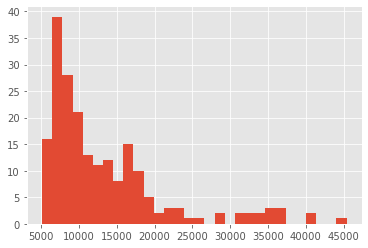

In [41]:
from scipy.stats import kurtosis
from scipy.stats import skew

plt.style.use('ggplot')

data_price = data['price']

plt.hist(data_price, bins=30)

print("skew : ",skew(data_price))
print("kurt : ",kurtosis(data_price))

### 5. Визуализировать несколько взаимосвязей между переменными

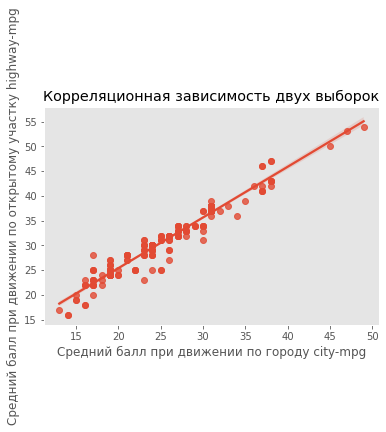

In [43]:
city_mpg = data['city-mpg']
highway_mpg = data['highway-mpg']
sns.regplot(x= city_mpg, y=highway_mpg,data=data, fit_reg=True)
plt.xlabel('Средний балл при движении по городу city-mpg')
plt.ylabel('Средний балл при движении по открытому участку highway-mpg')
plt.title('Корреляционная зависимость двух выборок')
plt.grid(False)
plt.show()

Коэффициент корреляции между highway-mpg и city-mpg 0.97, то же самое показывает и график. 

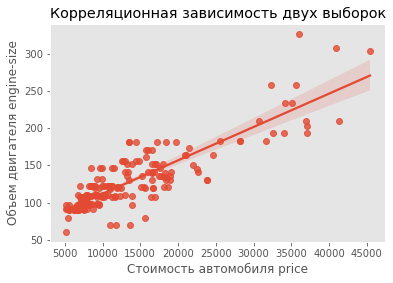

In [44]:
price = data['price']
engine_size = data['engine-size']
sns.regplot(x= price, y=engine_size, data=data, fit_reg=True)
plt.xlabel('Стоимость автомобиля price')
plt.ylabel('Объем двигателя engine-size')
plt.title('Корреляционная зависимость двух выборок')
plt.grid(False)
plt.show()

Коэффициент корреляции между ценой автомобиля и объемом двигателя равен 0.87, что логично - чем больше объем двигателя, тем выше стоимость, это же подтверждается и графиком зависимости. 

Либо сразу построим несколько графиков

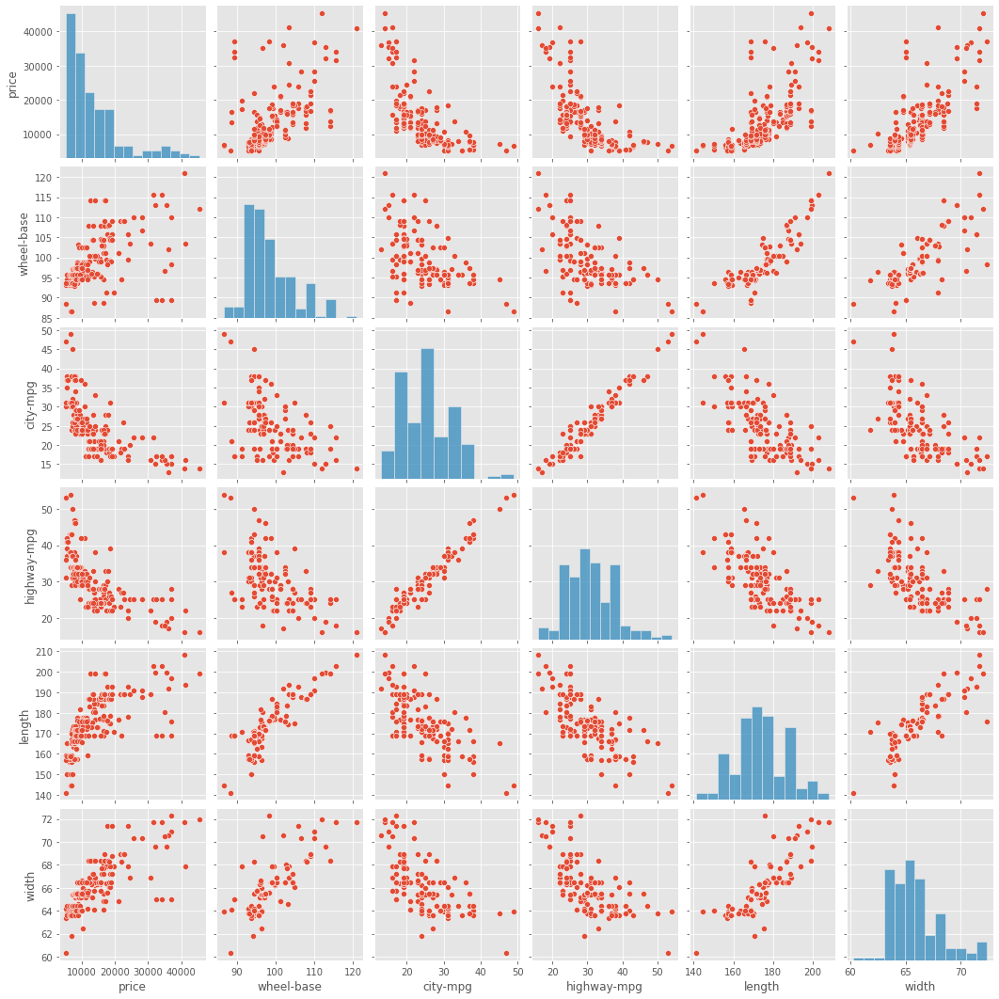

In [45]:
sns.pairplot(data, vars=['price', 'wheel-base', 'city-mpg', 
                         'highway-mpg', 'length', 'width'], kind = 'scatter')

### 6. Выдвинуть несколько гипотез по набору имеющихся переменных и проверить эти гипотезы с использованием t-test.

### Типы t-теста:
1. Независимый выборочный t-тест сравнивает средние значения для двух групп

2. В парном выборочном t-тесте сравниваются средние значения из одной и той же группы в разное время (например, с разницей в 1 год)
3. Т-тест для одной выборки проверяет среднее значение одной группы на соответствие известному среднему значению

### Необходимые условия:
1. Наблюдения в каждой выборке независимы и распределены одинаково
2. Выборки имеют нормальное распределение
3. Наблюдения в каждой выборке имеют одинаковую дисперсию

### Толкование:
Н0: средние значения выборок равны

Н1: средние значения выборок неодинаковы

Проверим гипотезу о том, что кабриолеты стоят дороже автомобилей других типов кузова. Для этого сравним цены на кабриолеты и цены на все остальные автомобили (седаны, хетчбеки и т.п.)

In [47]:
convertible_price = data[data['body-style']== 'convertible']['price']
stats.ttest_1samp(convertible_price, data['price'].mean())

Ttest_1sampResult(statistic=1.878045650268961, pvalue=0.1191754418263718)

T-значение 1.87, и в одновыборочном критерии мы оцениваем только p-value.

p-value равно 0.12, что намного больше стандартной альфа ошибки 0.05, поэтому мы принимаем нулевую гипотезу и можем сказать, что нет статистического различия между ценой на кабриолеты и генеральной совокупностью вцелом.

Построим график вероятности выборки и генеральной совокупности.

/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


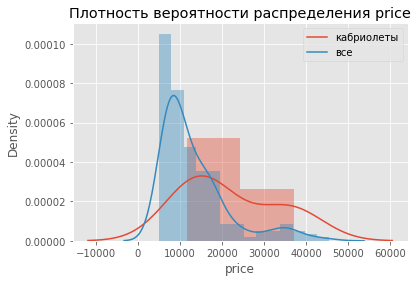

In [48]:
price = data['price'] #генеральная совокупность по давлению
sns.distplot(convertible_price)
sns.distplot(price)
plt.title('Плотность вероятности распределения price')
plt.legend(['кабриолеты', 'все'])
plt.show()

In [50]:
len(convertible_price), len(price)

(6, 205)

Выборки сильно отличаются по количеству, попробуем привести их к одной длине

In [51]:
price = price.sample(n=10)

/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

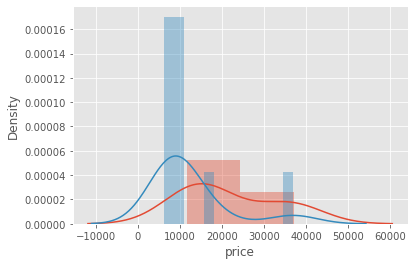

In [52]:
sns.distplot(convertible_price)
sns.distplot(price)

In [55]:
stats.ttest_1samp(convertible_price, price.mean())

Ttest_1sampResult(statistic=2.103559496819548, pvalue=0.08934880530525688)

Повторный t-тест показал, что p-value = 0.09, что превышает 0.05, это значит что нет статистического различия между ценой на кабриолеты и генеральной совокупностью вцелом.

### Сравним цены на хетчбеки и цена на кабриолеты

In [58]:
hatchback_price = data[data['body-style']== 'hatchback']['price']
stats.ttest_ind(convertible_price, hatchback_price) #считаем т тест для 2-х выборок

Ttest_indResult(statistic=4.43134460178564, pvalue=3.18925095740487e-05)

Тест показал, что нет статистической разницы между двумя выборками

/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


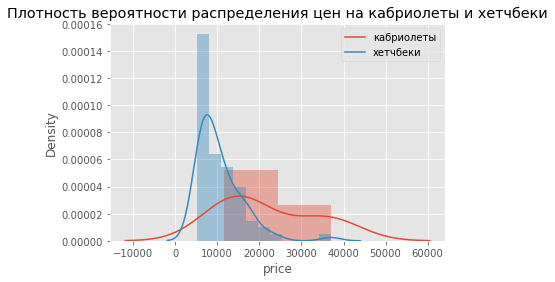

In [59]:
# построим графики вероятностей двух выборок
sns.distplot(convertible_price)
sns.distplot(hatchback_price)
plt.title('Плотность вероятности распределения цен на кабриолеты и хетчбеки')
plt.legend(['кабриолеты', 'хетчбеки'])
plt.show()

In [60]:
len(convertible_price), len(hatchback_price)

(6, 70)

In [63]:
hatchback_price = hatchback_price.sample(n=10)

In [64]:
stats.ttest_ind(convertible_price, hatchback_price)

Ttest_indResult(statistic=3.4194209725343754, pvalue=0.004149462649145516)

После того, как привели выборки к сопоставимой длине, t-тест показал что действительно, цены на кабриолеты и на хэтчбеки сильно отличаются

### Сравним расход автомобиля с турбиновым двигателем в городе и расход с атмосферным двигателем в городе

In [12]:
atmo_city = data[data['aspiration'] == 'std']['city-mpg']
turbo_city = data[data['aspiration'] == 'turbo']['city-mpg']

stats.ttest_ind(atmo_city, turbo_city)

Ttest_indResult(statistic=2.944124472348474, pvalue=0.0036162514551477372)

In [13]:
len(atmo_city)

168

In [14]:
len(turbo_city)

37

/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='city-mpg', ylabel='Density'>

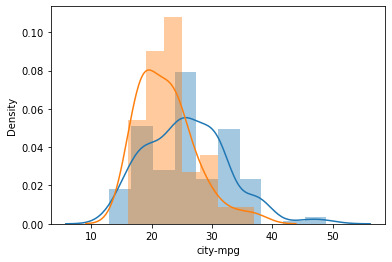

In [15]:
sns.distplot(atmo_city)
sns.distplot(turbo_city)

Проверили - распределение нормальное, значит т-тест корректен

### Сравним цены на бензиновые и газовые автомобили

In [66]:
price_gas = data.loc[data['fuel-type'] == 'gas', 'price']
price_diesel = data.loc[data['fuel-type'] == 'diesel', 'price']

stats.ttest_ind(price_gas, price_diesel)

Ttest_indResult(statistic=-1.4715061487687495, pvalue=0.1427027883743746)

/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/iriska/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

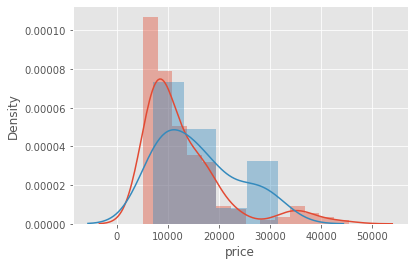

In [67]:
sns.distplot(price_gas)
sns.distplot(price_diesel)

In [68]:
len(price_gas), len(price_diesel)

(185, 20)

Распределение очень разное у бензина и дизеля, поэтому нужно сначала взять корректный семпл (чтобы количество было одинаковым)

In [69]:
price_diesel = price_diesel.sample(n=20)
price_gas = price_gas.sample(n=20)

In [70]:
stats.ttest_ind(price_gas, price_diesel)

Ttest_indResult(statistic=-1.0812893712974234, pvalue=0.2863830115250838)